# **Binary Segmentation with CUB-200-2011 Dataset**

In this notebook, a modified [U-Net](https://arxiv.org/abs/1505.04597) model is built using [ConvNeXt Base](https://arxiv.org/abs/2201.03545) as the backbone of the encoder. Then, the backbone layers are fine-tuned, and the upper layers (decoder) are trained for semantic segmentation tasks. In this specific case, the model is applied to binary semantic segmentation.  

The dataset used is [CUB-200-2011](https://www.vision.caltech.edu/datasets/cub_200_2011/), which contains 11,788 images of 200 bird species, with 5,994 images assigned for training and 5,794 for testing. Each image includes a binary segmentation mask, where class **0** represents the **background** and class **1** corresponds to the **bird**.

## **Imports**

In [ ]:
#!pip install tensorflow==2.15.0 -q #(TPU version)

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from google.colab import drive
from tqdm.auto import tqdm
import cv2
import os

## **Parameters**

In [3]:
drive.mount("/content/drive")

Mounted at /content/drive


In [2]:
zip_dataset_path = "/content/drive/MyDrive/Datasets/CUB_200_2011.zip"
dataset_dir = os.path.basename(zip_dataset_path).split(".")[0]
trained_model_path = "/content/drive/MyDrive/models/BinarySegmentation_ConvNeXtBase-U-Net_CUB-200-2011.h5"
epochs = 50
batch_size = 32
patience = 5
SEED = 123
AUTOTUNE = tf.data.AUTOTUNE
buffer_size = 1024
image_size = (384, 384, 3)

## **Prepare the Dataset for Training**

### **Load the Dataset**

The download and all preliminary preprocessing of the CUB-200-2011 dataset were completed in the following notebook: [Preprocessing_CUB-200-2011_eBird](https://github.com/JersonGB22/ImageClassification-TensorFlow/blob/main/Preprocessing/Preprocessing_CUB-200-2011_eBird.ipynb).

In [8]:
# Unzip the dataset
!unzip -q $zip_dataset_path

In [9]:
# Obtain the training and testing DataFrames
df_data = pd.read_csv(os.path.join(dataset_dir, "metadata_cub-200-2011.csv"))
df_train = df_data[df_data.split == 1]
df_test = df_data[df_data.split == 0]

print(len(df_train), len(df_test))
df_data

5994 5794


,id,image,label,name,box,split,mask
0,9180,/content/CUB_200_2011/images/157.Yellow_throat...,156,Yellow throated Vireo,"[182.0, 104.0, 107.0, 144.0]",0,/content/CUB_200_2011/masks/157.Yellow_throate...
1,11076,/content/CUB_200_2011/images/189.Red_bellied_W...,188,Red bellied Woodpecker,"[22.0, 120.0, 391.0, 358.0]",1,/content/CUB_200_2011/masks/189.Red_bellied_Wo...
2,6341,/content/CUB_200_2011/images/109.American_Reds...,108,American Redstart,"[107.0, 91.0, 324.0, 340.0]",0,/content/CUB_200_2011/masks/109.American_Redst...
3,98,/content/CUB_200_2011/images/002.Laysan_Albatr...,1,Laysan Albatross,"[118.0, 19.0, 222.0, 294.0]",0,/content/CUB_200_2011/masks/002.Laysan_Albatro...
4,8621,/content/CUB_200_2011/images/147.Least_Tern/Le...,146,Least Tern,"[160.0, 79.0, 318.0, 363.0]",1,/content/CUB_200_2011/masks/147.Least_Tern/Lea...
...,...,...,...,...,...,...,...
11783,7764,/content/CUB_200_2011/images/133.White_throate...,132,White throated Sparrow,"[113.0, 47.0, 329.0, 242.0]",1,/content/CUB_200_2011/masks/133.White_throated...
11784,5219,/content/CUB_200_2011/images/090.Red_breasted_...,89,Red breasted Merganser,"[97.0, 71.0, 365.0, 165.0]",0,/content/CUB_200_2011/masks/090.Red_breasted_M...
11785,1347,/content/CUB_200_2011/images/025.Pelagic_Cormo...,24,Pelagic Cormorant,"[103.0, 91.0, 287.0, 213.0]",0,/content/CUB_200_2011/masks/025.Pelagic_Cormor...
11786,11647,/content/CUB_200_2011/images/198.Rock_Wren/Roc...,197,Rock Wren,"[262.0, 63.0, 172.0, 174.0]",1,/content/CUB_200_2011/masks/198.Rock_Wren/Rock...


In [3]:
# Define the classes and their respective colors
classes = {
    "background": [0, 0, 32],
    "bird": [0, 0, 255]
}

class_names = list(classes.keys())
class_colors = np.array(list(classes.values()))
num_classes = len(class_names)
background_class = class_names.index("background")

### **Create the Training and Testing Datasets**

Data augmentation is crucial for improving a model's performance and combating overfitting. However, unfortunately, TensorFlow does not provide specific functions or layers for data augmentation in semantic segmentation tasks, so they must be implemented manually.

In [ ]:
# Function for performing random horizontal flipping of the image and its mask
@tf.function
def random_flip_left_right(image, mask, p=0.5):
  if tf.random.uniform(()) > (1 - p):
    image = tf.image.flip_left_right(image)
    mask = tf.image.flip_left_right(mask)
  return image, mask


# Function for applying random horizontal and vertical translation to the image and its mask
# Inspired by https://github.com/keras-team/keras/blob/v3.3.3/keras/src/layers/preprocessing/random_translation.py#L7-L251
@tf.function
def random_translation(image, mask, height_factor=0.1, width_factor=0.1, p=0.5):
  if tf.random.uniform(()) > (1 - p):
    shape = tf.shape(image)[:2]
    height, width = tf.cast(shape[0], tf.float32), tf.cast(shape[1], tf.float32)

    height_shift = tf.random.uniform((), -height_factor, height_factor) * height
    width_shift = tf.random.uniform((), -width_factor, width_factor) * width
    transformation = tf.cast([[1, 0, -width_shift, 0, 1, -height_shift, 0, 0]], tf.float32)

    image = tf.raw_ops.ImageProjectiveTransformV3(
        images=image[None, :],
        transforms=transformation,
        output_shape=shape,
        fill_value=0,
        interpolation="BILINEAR",
        fill_mode="CONSTANT"
    )[0]
    mask = tf.raw_ops.ImageProjectiveTransformV3(
        images=mask[None, :],
        transforms=transformation,
        output_shape=shape,
        fill_value=background_class,
        interpolation="NEAREST",
        fill_mode="CONSTANT"
    )[0]

  return image, mask


# Function for performing random rotation of the image and its mask
# Inspired by https://github.com/keras-team/keras/blob/v3.3.3/keras/src/layers/preprocessing/random_rotation.py#L9-L254
@tf.function
def random_rotation(image, mask, max_angle=15, p=0.5):
  if tf.random.uniform(()) > (1 - p):
    shape = tf.shape(image)[:2]
    height, width = tf.cast(shape[0], tf.float32), tf.cast(shape[1], tf.float32)

    max_angle *= tf.constant(np.pi) / 180
    angle = tf.random.uniform((), -max_angle, max_angle)

    sin_angle = tf.sin(angle)
    cos_angle = tf.cos(angle)
    x_offset = ((width - 1) - (cos_angle * (width - 1) - sin_angle * (height - 1))) / 2
    y_offset = ((height - 1) - (sin_angle * (width - 1) + cos_angle * (height - 1))) / 2

    transformation = tf.convert_to_tensor(
        [[cos_angle, -sin_angle, x_offset, sin_angle, cos_angle, y_offset, 0, 0]],
        dtype=tf.float32
    )

    image = tf.raw_ops.ImageProjectiveTransformV3(
        images=image[None, :],
        transforms=transformation,
        output_shape=shape,
        fill_value=0,
        interpolation="BILINEAR",
        fill_mode="CONSTANT"
    )[0]

    mask = tf.raw_ops.ImageProjectiveTransformV3(
        images=mask[None, :],
        transforms=transformation,
        output_shape=shape,
        fill_value=background_class,
        interpolation="NEAREST",
        fill_mode="CONSTANT"
    )[0]

  return image, mask


# Function for randomly altering the brightness and contrast of the image
@tf.function
def random_brightness_contrast(image, brightness_limit=0.2, contrast_limit=0.3, p=0.5):
  if tf.random.uniform(()) > (1 - p):
    image = tf.image.random_brightness(image, brightness_limit)
    image = tf.image.random_contrast(image, 1-contrast_limit, 1+contrast_limit)
  return image

In [ ]:
# Function to preprocess an image and its mask
@tf.function
def preprocessing(image_path, mask_path, image_size=image_size[:-1]):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.resize(image, image_size)

  mask = tf.io.read_file(mask_path)
  mask = tf.image.decode_png(mask, channels=1)
  mask = tf.image.resize(mask, image_size, method="nearest")

  return image, mask


# Function for data augmentation
def data_augmentation(image, mask, p=0.5):
  image, mask = random_flip_left_right(image, mask, p=p)
  image, mask = random_translation(image, mask, p=p)
  image, mask = random_rotation(image, mask, p=p)
  image = random_brightness_contrast(image, brightness_limit=0.15, contrast_limit=0.2, p=p)

  return image, mask


# Function to convert the DataFrame into a Dataset for training or evaluation
def prepare_dataset(df, train=True, drop_remainder=True):
  dataset = tf.data.Dataset.from_tensor_slices((df["image"].values, df["mask"].values))
  dataset = dataset.map(preprocessing, num_parallel_calls=AUTOTUNE)

  if train:
    dataset = dataset.map(data_augmentation, num_parallel_calls=AUTOTUNE)
    dataset = dataset.shuffle(buffer_size, seed=SEED)

  dataset = (
      dataset.
      map(lambda x, y: (x,  tf.squeeze(y)), num_parallel_calls=AUTOTUNE).
      batch(batch_size, drop_remainder=drop_remainder).
      prefetch(AUTOTUNE)
  )

  return dataset

In the Google Colab TPU environment, when using custom loss functions to train a model, it is necessary for all batches to have the same size. Otherwise, the loss at the end of the first epoch will return a **NaN** value. Therefore, the `drop_remainder` parameter should be set to **True** to discard the last batch of a dataset. Additionally, it is important to choose a batch size that removes the least amount of data from the last batch to minimize the impact on training.  

On the other hand, during model evaluation, the complete dataset should be used with `drop_remainder` set to **False**. Although if a batch size is chosen that removes very few data, the evaluation results will vary slightly, being virtually the same, but it is a good practice to set `drop_remainder` to **False** during evaluation to obtain exact results.

In [ ]:
# Number of records deleted
len(df_train) % batch_size, len(df_test) % batch_size

(10, 2)

In [ ]:
train_dataset = prepare_dataset(df_train)
test_dataset = prepare_dataset(df_test, train=False)

In [ ]:
# Take a batch from the training dataset
for images, masks in train_dataset.take(1):
  print(images.shape)
  print(masks.shape)

(32, 384, 384, 3)
(32, 384, 384)


In [ ]:
# Function to plot images with their segmentation masks
def plot_image_masks(images, masks, masks_pred=None, n_rows=3, random=True, blended=False,
                     alpha=0.5, metric=None, preprocess=False, save=False, path_save=""):

  indices = np.arange(len(images))
  if random:
    np.random.shuffle(indices)

  n_cols = 2 if masks_pred is None else 3
  titles = ["Image", "True Mask"] + ([] if masks_pred is None else ["Pred Mask"])

  fig, axes = plt.subplots(n_rows, n_cols, figsize=(3.25 * n_cols, 3.25 * n_rows))
  for col, title in enumerate(titles):
    axes[0, col].set_title(title, fontsize=10)

  for i in range(n_rows):
    idx = indices[i]
    image = np.clip(images[idx] / 255, 0, 1)
    mask_cls = masks[idx]
    mask_rgb = class_colors[mask_cls] / 255
    shape = image.shape

    if blended:
      mask_rgb = mask_rgb.astype(image.dtype)
      mask_rgb[mask_cls == background_class] = image[mask_cls == background_class]
      mask_rgb = cv2.addWeighted(image, 1 - alpha, mask_rgb, alpha, 0)

    axes[i, 0].imshow(image)
    axes[i, 0].axis("off")
    axes[i, 1].imshow(mask_rgb)
    axes[i, 1].axis("off")

    if masks_pred is not None:
      mask_cls_pred = masks_pred[idx]
      mask_rgb_pred = class_colors[mask_cls_pred] / 255

      if blended:
        mask_rgb_pred = mask_rgb_pred.astype(image.dtype)
        mask_rgb_pred[mask_cls_pred == background_class] = image[mask_cls_pred == background_class]
        mask_rgb_pred = cv2.addWeighted(image, 1 - alpha, mask_rgb_pred, alpha, 0)

      axes[i, 2].imshow(mask_rgb_pred)
      axes[i, 2].axis("off")

      if metric is not None:
        metric.reset_state()
        metric.update_state(mask_cls, mask_cls_pred, preprocess=preprocess)

        axes[i, 2].text(
          x=shape[1]/2, y=shape[0],
          s=f"{metric.metric_name.replace('_', ' ')}: {metric.result():.3f}",
          fontsize=7, ha="center", va="top",
        )

  plt.tight_layout()
  # Save images
  if save:
    plt.savefig(path_save)

  plt.show()

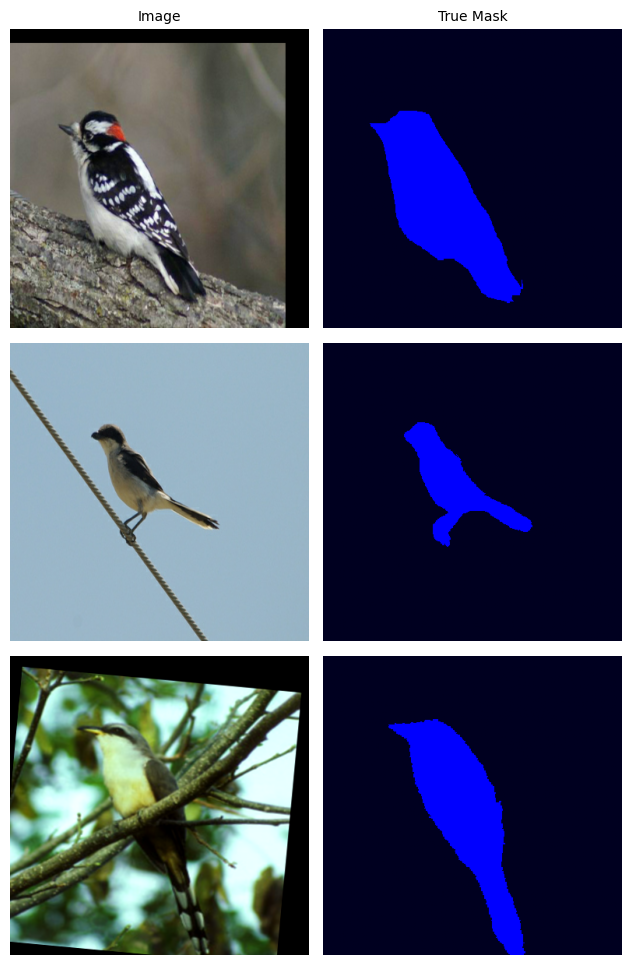

In [ ]:
# Some images and masks from the training dataset after data augmentation
plot_image_masks(images, masks)

## **Build and Compile the Model**

The architecture of the [U-Net](https://arxiv.org/abs/1505.04597) model consists of a contraction path (encoder) to capture context and a symmetric expansion path (decoder) that allows for precise localization. To improve the model's performance, the [ConvNeXt Base](https://arxiv.org/abs/2201.03545) model is used as the encoder's backbone, which has been pre-trained on the [ImageNet-21k](https://github.com/Alibaba-MIIL/ImageNet21K) dataset and fine-tuned with the [ImageNet-1k](https://www.image-net.org/download.php) dataset, making it a very robust feature extractor. Additionally, two **Batch Normalization** layers are incorporated into each convolutional block of the decoder to help mitigate **overfitting** and **gradient vanishing**, which are common problems in deep neural networks. This modified U-Net architecture is generic and can be used for both binary and multiclass semantic segmentation tasks.

![U-Net](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png)
*Original U-Net model*

### **U-Net with ConvNeXt Base Encoder for Semantic Segmentation**

In [4]:
# Convolutional block with optional Batch Normalization
def conv2d_block(inputs, filters, use_bn):
  x = tf.keras.layers.Conv2D(filters, kernel_size=3, padding="same")(inputs)
  if use_bn:
    x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.Activation("relu")(x)

  x = tf.keras.layers.Conv2D(filters, kernel_size=3, padding="same")(x)
  if use_bn:
    x = tf.keras.layers.BatchNormalization()(x)
  x = tf.keras.layers.Activation("relu")(x)

  return x


# Decoder block consisting of transposed convolution followed by concatenation with encoder features
def decoder_block(inputs, enc, filters, strides, use_bn):
  dec = tf.keras.layers.Conv2DTranspose(filters, kernel_size=3, strides=strides, padding="same", activation="relu")(inputs)
  dec = tf.keras.layers.concatenate([dec, enc])
  dec = conv2d_block(dec, filters, use_bn=use_bn)
  return dec


# Build a U-Net model using ConvNeXt Base as the encoder backbone
def build_convnext_unet(input_shape, num_classes, filters=64, use_bn=True):
  encoder = tf.keras.applications.ConvNeXtBase(
      include_top=False,
      include_preprocessing=True,
      weights="imagenet",
      input_shape=input_shape
  )

  encoder.trainable = True
  inputs = encoder.input #(None, 384, 384, 3)

  # Encoder
  enc1 = encoder.get_layer("input_1")                 #(None, 384, 384, 3)
  enc2 = encoder.get_layer("tf.__operators__.add_2")  #(None, 96, 96, 128)
  enc3 = encoder.get_layer("tf.__operators__.add_5")  #(None, 48, 48, 256)
  enc4 = encoder.get_layer("tf.__operators__.add_32") #(None, 24, 24, 512)

  # Bottleneck
  bottleneck = encoder.output #(None, 12, 12, 1024)

  # Decoder
  dec4 = decoder_block(bottleneck, enc4.output, filters * 8, strides=2, use_bn=use_bn) #(None, 24, 24, 512)
  dec3 = decoder_block(dec4, enc3.output, filters * 4, strides=2, use_bn=use_bn)       #(None, 48, 48, 256)
  dec2 = decoder_block(dec3, enc2.output, filters * 2, strides=2, use_bn=use_bn)       #(None, 96, 96, 128)
  dec1 = decoder_block(dec2, enc1.output, filters, strides=4, use_bn=use_bn)           #(None, 384, 384, 64)

  outputs = tf.keras.layers.Conv2D(num_classes, kernel_size=1, activation="softmax")(dec1) #(None, 384, 384, num_classes)

  model = tf.keras.Model(inputs, outputs, name="ConvNeXtBase-U-Net")
  return model

### **Create the Segmentation Metrics and Loss**

In image semantic segmentation, the most commonly used metrics to evaluate model performance are **Mean IoU** and **Dice Score**.  

1. **Mean IoU:** Mean IoU (Intersection over Union) measures the overlap between the predicted areas and the ground truth areas for each class and averages the results across all classes. It is a standard metric in semantic segmentation. Its general formula for the multiclass case is:  
   $$
   Mean\ IoU = \frac{1}{C} \sum_{c=1}^C \frac{|P_c \cap T_c|}{|P_c \cup T_c|}
   $$
   Where:  
   - $C$ is the number of classes.  
   - $P_c$ and $T_c$ represent the predicted areas and the ground truth areas for class $c$.  
   - $|P_c \cap T_c|$ is the intersection area between the prediction and the ground truth.  
   - $|P_c \cup T_c|$ is the union area between the prediction and the ground truth.  

2. **Dice Score:** Dice Score (or Dice Coefficient) is another common metric that measures the similarity between predicted and true areas. It is particularly useful for imbalanced datasets. Its general formula for the multiclass case is:  
   $$
   Dice\ Score = \frac{1}{C} \sum_{c=1}^C \frac{2 |P_c \cap T_c|}{|P_c| + |T_c|}
   $$
   The terms are the same as in Mean IoU, but Dice Score is more sensitive to small differences between the prediction and the ground truth.  

A custom class implemented in TensorFlow is introduced below to calculate these metrics, designed to work for both binary and multiclass segmentation. Key features of this class include:  

- **Support for ignored classes:** Specific classes, such as the background or unlabeled regions, can be excluded from the metric calculations. An example of this case can be seen in the notebook [SemanticSegmentation_SegFormer-B2_CamVid](https://github.com/JersonGB22/ImageSegmentation-TensorFlow-PyTorch/blob/main/SemanticSegmentation/SemanticSegmentation_SegFormer-B2_CamVid.ipynb).

- **Handling absent classes:** If one or more classes are missing in the true and predicted masks, the metric returns a NaN value for those classes, ensuring they are excluded from the final calculation. This is particularly useful in multiclass segmentation, where individual masks or batches may not include all classes in a specific dataset. A specific case can be seen in the notebook [SemanticSegmentation_SegFormer-B3_LandCover.ai](https://github.com/JersonGB22/ImageSegmentation-TensorFlow-PyTorch/blob/main/SemanticSegmentation/SemanticSegmentation_SegFormer-B3_LandCover.ai.ipynb).

In [ ]:
# Custom class to calculate Mean IoU or Dice Score
@tf.keras.utils.register_keras_serializable()
class SegmentationMetrics(tf.keras.metrics.Metric):
  def __init__(self, metric_name, num_classes, ignore_class=None, **kwargs):

    if metric_name not in {"mean_iou", "dice_score"}:
      raise ValueError("Invalid metric. Choose 'mean_iou' or 'dice_score'.")

    super().__init__(name=metric_name, **kwargs)
    self.metric_name = metric_name
    self.num_classes = num_classes
    self.ignore_class = ignore_class

    # Initialize tensors to store cumulative intersection and combined areas
    self.intersect_area_total = self.add_weight(name="intersect_area", shape=(num_classes,), initializer="zeros")
    self.combined_area_total = self.add_weight(name="combined_area", shape=(num_classes,), initializer="zeros")

  def update_state(self, y_true, y_pred, preprocess=True, sample_weight=None):
    # Convert logits to class predictions if preprocessing is enabled
    if preprocess:
      y_pred = tf.argmax(y_pred, axis=-1)

    # Flatten predictions and labels
    y_true = tf.reshape(tf.cast(y_true, tf.int32), (-1,))
    y_pred = tf.reshape(tf.cast(y_pred, tf.int32), (-1,))

    # Apply mask to ignore specific class, if configured
    if self.ignore_class is not None:
      mask = tf.not_equal(y_true, self.ignore_class)
      y_true = tf.boolean_mask(y_true, mask)
      y_pred = tf.boolean_mask(y_pred, mask)

    # Convert to one-hot encoding for multiclass processing
    y_true = tf.one_hot(y_true, depth=self.num_classes)
    y_pred = tf.one_hot(y_pred, depth=self.num_classes)

    # Calculate intersection and combined areas
    intersect_area = tf.reduce_sum(y_true * y_pred, axis=0)
    combined_area = tf.reduce_sum(y_true + y_pred, axis=0)

    # Update cumulative totals
    self.intersect_area_total.assign_add(intersect_area)
    self.combined_area_total.assign_add(combined_area)

  # Compute metric for each class
  def result_by_class(self):
    if self.metric_name == "mean_iou":
      union_area_total = self.combined_area_total - self.intersect_area_total
      metric = tf.math.divide_no_nan(self.intersect_area_total, union_area_total)
    else:
      metric = tf.math.divide_no_nan(2 * self.intersect_area_total, self.combined_area_total)

    # Assign NaN to classes with no samples
    metric = tf.where(self.combined_area_total > 0, metric, tf.constant(float("nan"), dtype=metric.dtype))
    return metric

  # Calculate average metric across valid classes
  def result(self):
    metric = self.result_by_class()
    metric = tf.boolean_mask(metric, tf.logical_not(tf.math.is_nan(metric)))
    return tf.reduce_mean(metric)

  # Reset accumulated values
  def reset_state(self):
    self.intersect_area_total.assign(tf.zeros_like(self.intersect_area_total))
    self.combined_area_total.assign(tf.zeros_like(self.combined_area_total))

  # Returns the configuration of the metric as a dictionary for serialization
  def get_config(self):
    return {
        "metric_name": self.metric_name,
        "num_classes": self.num_classes,
        "ignore_class": self.ignore_class
    }


# Custom function to calculate Accuracy with the option to ignore a class
@tf.keras.utils.register_keras_serializable()
def compute_accuracy(ignore_class=None):
  def accuracy(y_true, y_pred):
    y_pred = tf.cast(tf.argmax(y_pred, axis=-1), y_true.dtype)
    true_positives = tf.cast(y_true == y_pred, tf.float32)

    if ignore_class is not None:
      mask = tf.cast(y_true != ignore_class, tf.float32)
      acc = tf.reduce_sum(true_positives * mask) / tf.reduce_sum(mask)
    else:
      acc = tf.reduce_mean(true_positives)

    return acc
  return accuracy

As stated in [Sudre et al., 2017](https://arxiv.org/pdf/1707.03237), traditional losses such as weighted cross-entropy may be inadequate for semantic segmentation tasks due to class imbalance, which is common in applications like medical image segmentation. In these cases, minority classes may be insufficiently penalized, leading to poor segmentation performance. The **Generalized Dice Loss** addresses this issue by dynamically adjusting class weights, making it more sensitive to minority classes while maintaining strong performance on dominant classes, achieving better results in scenarios involving imbalanced classes and complex data distributions.

The **Generalized Dice Loss** is defined as:

$$
GDL = 1 - 2 \cdot \frac{\sum_{c=1}^{C} w_c \cdot \sum_i g_{ic} p_{ic}}{\sum_{c=1}^{C} w_c \cdot \sum_i (g_{ic} + p_{ic})}
$$

Where:

- $C$ is the total number of classes.
- $g_{ic}$ is the binary ground truth for pixel $i$ of class $c$.
- $p_{ic}$ is the predicted probability for pixel $i$ of class $c$.
- $w_c$ is a weight defined as:

 $$w_c = \frac{1}{\left(\sum_i g_{ic}\right)^2}$$

This weighting compensates for class imbalance by giving greater importance to minority classes during loss computation.

However, it is important to note that this loss is not suitable when there is a need to ignore a class. This is the case, for example, in scenarios where classes like the background or unlabeled categories must be excluded. It is also unsuitable when not all classes of a specific dataset are present in each segmentation mask or batch of masks.

In [ ]:
@tf.keras.utils.register_keras_serializable()
class GeneralizedDiceLoss(tf.keras.losses.Loss):
  def __init__(self, num_classes, from_logits=False, name="generalized_dice_loss"):
    super().__init__(name=name)
    self.num_classes = num_classes
    self.from_logits = from_logits
    self.name = name

  def call(self, y_true, y_pred):
    # Apply softmax to predicted logits, if configured
    if self.from_logits:
      y_pred = tf.nn.softmax(y_pred, axis=-1)

    # Convert ground truth to one-hot encoding
    y_true_ohe = tf.one_hot(tf.cast(y_true, tf.int32), depth=self.num_classes)

    # Calculate the class weights and areas
    intersect_area = tf.reduce_sum(y_true_ohe * y_pred, axis=[0, 1, 2])
    combined_area = tf.reduce_sum(y_true_ohe + y_pred, axis=[0, 1, 2])
    w = tf.math.divide_no_nan(1, tf.reduce_sum(y_true_ohe, axis=[0, 1, 2]) ** 2)

    # Apply weights to areas
    weighted_intersect = tf.reduce_sum(w * intersect_area)
    weighted_combined = tf.reduce_sum(w * combined_area)

    # Compute the Generalized Dice Loss
    loss = 1 - (2 * tf.math.divide_no_nan(weighted_intersect, weighted_combined))
    return loss

  # Returns the configuration of the loss as a dictionary for serialization
  def get_config(self):
    return {
        "num_classes": self.num_classes,
        "from_logits": self.from_logits,
        "name": self.name
    }

### **TPU Initialization and Model Compilation**

In [ ]:
# TPU setup
try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu="local")
  tf.config.experimental_connect_to_cluster(tpu)
  tf.tpu.experimental.initialize_tpu_system(tpu)
  strategy = tf.distribute.TPUStrategy(tpu)
  print("TPU initialized:")
  print("All devices: ", tf.config.list_logical_devices("TPU"))
except (ValueError, tf.errors.InvalidArgumentError, tf.errors.NotFoundError) as error:
  print(f"Error: {error}")

TPU initialized:
All devices:  [LogicalDevice(name='/device:TPU:0', device_type='TPU'), LogicalDevice(name='/device:TPU:1', device_type='TPU'), LogicalDevice(name='/device:TPU:2', device_type='TPU'), LogicalDevice(name='/device:TPU:3', device_type='TPU'), LogicalDevice(name='/device:TPU:4', device_type='TPU'), LogicalDevice(name='/device:TPU:5', device_type='TPU'), LogicalDevice(name='/device:TPU:6', device_type='TPU'), LogicalDevice(name='/device:TPU:7', device_type='TPU')]


In [ ]:
# Compile the model within the TPU strategy
tf.keras.backend.clear_session()

with strategy.scope():
  model = build_convnext_unet(image_size, num_classes)

  lr_schedule = tf.keras.optimizers.schedules.PolynomialDecay(
      initial_learning_rate=1e-4,
      decay_steps=len(train_dataset)*epochs,
      end_learning_rate=1e-6
  )

  model.compile(
      optimizer=tf.keras.optimizers.Adam(lr_schedule),
      loss=GeneralizedDiceLoss(num_classes),
      metrics=[
          compute_accuracy(),
          SegmentationMetrics("mean_iou", num_classes)
      ]
  )

model.summary()

350926856/350926856 [==============================] - 1s 0us/step
Model: "ConvNeXtBase-U-Net"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 384, 384, 3)]        0         []                            
                                                                                                  
 convnext_base_prestem_norm  (None, 384, 384, 3)          0         ['input_1[0][0]']             
 alization (Normalization)                                                                        
                                                                                                  
 convnext_base_stem (Sequen  (None, 96, 96, 128)          6528      ['convnext_base_prestem_normal
 tial)                                                              ization[0][0]']               
              

In [ ]:
# Necessary libraries to plot the model architecture on the Colab TPU
!pip install pydot graphviz -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.1/47.1 kB 1.5 MB/s eta 0:00:00


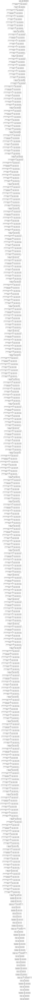

In [ ]:
# Visualize the model architecture
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_names=True, dpi=60)

## **Train the Model**

In [ ]:
# Early stopping callback to monitor test Mean IoU
callback = tf.keras.callbacks.EarlyStopping(
    monitor="val_mean_iou",
    patience=patience,
    mode="max",
    restore_best_weights=True
)

In [ ]:
history = model.fit(
    train_dataset,
    validation_data=test_dataset,
    epochs=epochs,
    callbacks=[callback]
)

Epoch 1/50
187/187 [==============================] - 483s 954ms/step - loss: 0.2979 - accuracy: 0.9119 - mean_iou: 0.7379 - val_loss: 0.3660 - val_accuracy: 0.9757 - val_mean_iou: 0.9088
Epoch 2/50
187/187 [==============================] - 143s 713ms/step - loss: 0.0751 - accuracy: 0.9870 - mean_iou: 0.9484 - val_loss: 0.0887 - val_accuracy: 0.9877 - val_mean_iou: 0.9499
Epoch 3/50
187/187 [==============================] - 143s 708ms/step - loss: 0.0567 - accuracy: 0.9882 - mean_iou: 0.9529 - val_loss: 0.0532 - val_accuracy: 0.9881 - val_mean_iou: 0.9514
Epoch 4/50
187/187 [==============================] - 141s 697ms/step - loss: 0.0483 - accuracy: 0.9889 - mean_iou: 0.9556 - val_loss: 0.0452 - val_accuracy: 0.9886 - val_mean_iou: 0.9538
Epoch 5/50
187/187 [==============================] - 140s 693ms/step - loss: 0.0437 - accuracy: 0.9891 - mean_iou: 0.9566 - val_loss: 0.0431 - val_accuracy: 0.9885 - val_mean_iou: 0.9534
Epoch 6/50
187/187 [==============================] - 141s 6

In [ ]:
# Save the model weights
model.save_weights(trained_model_path)

## **Model Evaluation**

In [ ]:
# Evaluation excluding the last batches of the datasets (drop_remainder=True)
metrics_train = model.evaluate(train_dataset, verbose=0)
metrics_test = model.evaluate(test_dataset, verbose=0)

print(f"Train\tLoss: {metrics_train[0]}; Mean IoU: {metrics_train[2]}; Accuracy: {metrics_train[1]}")
print(f"Test\tLoss: {metrics_test[0]}; Mean IoU: {metrics_test[2]}; Accuracy: {metrics_test[1]}")

Train	Loss: 0.02989591471850872; Mean IoU: 0.9650084972381592; Accuracy: 0.991302490234375
Test	Loss: 0.037688467651605606; Mean IoU: 0.9552936553955078; Accuracy: 0.9890446662902832


### **Graphs of the metrics**

In [ ]:
# Library needed to convert Plotly interactive graphics into images
!pip install kaleido -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 11.8 MB/s eta 0:00:00


In [ ]:
history = history.history
idxmax = history["val_mean_iou"].index(max(history["val_mean_iou"]))

In [ ]:
# Function to plot the metrics
def plot_metrics(history, idxmax, metrics=["loss"], renderer=None):
  epochs = len(history["loss"])
  list_epochs = np.arange(1, epochs+1)
  num_metrics = len(metrics)
  patience = idxmax + 1

  for metric in metrics[:num_metrics]:
    values = history[metric]
    val_values = history[f"val_{metric}"]

    fig=go.Figure()
    fig.add_trace(go.Scatter(x=list_epochs, y=values, name=metric, line=dict(color="blue", width=2)))
    fig.add_trace(go.Scatter(x=list_epochs, y=val_values, name=f"Val {metric}", line=dict(color="#FF6600", width=2)))

    fig.add_vline(
        x=patience, line=dict(color="red", width=2, dash="dash"),
        annotation_text="End of Training", annotation_position="top left",
        annotation=dict(font_size=12, font_color="red")
    )

    fig.update_xaxes(title_text="Epoch")
    fig.update_yaxes(title_text=metric)
    fig.update_layout(
        title=f"Evolution of {metric} across Epochs",
        title_font=dict(size=20),
        title_x=0.5,
        height=500,
        width=1200
    )

    fig.show(renderer)

In [ ]:
# Interactive graphic
plot_metrics(history, idxmax, metrics=list(history.keys())[:3])

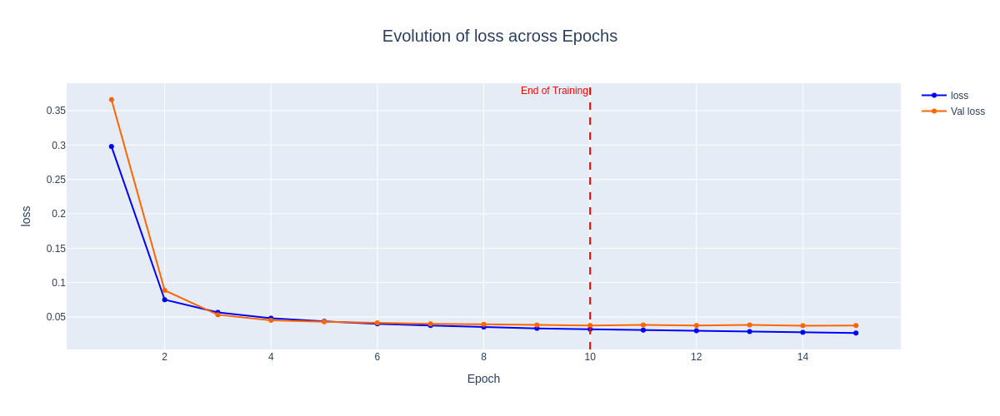

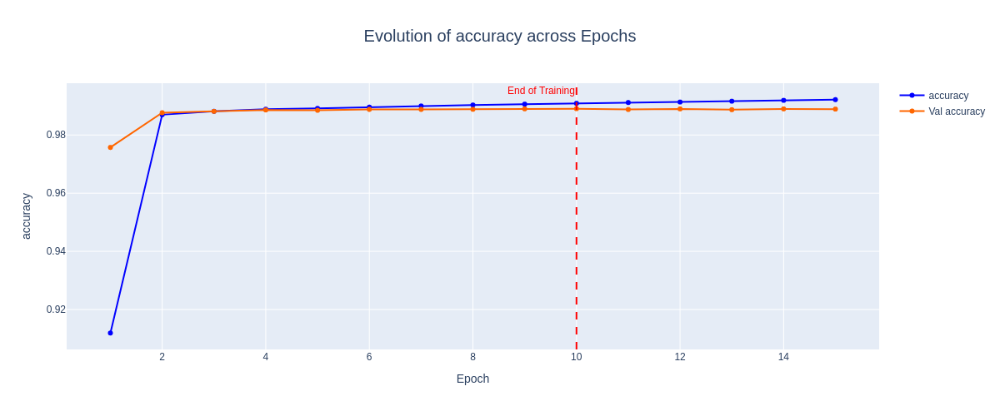

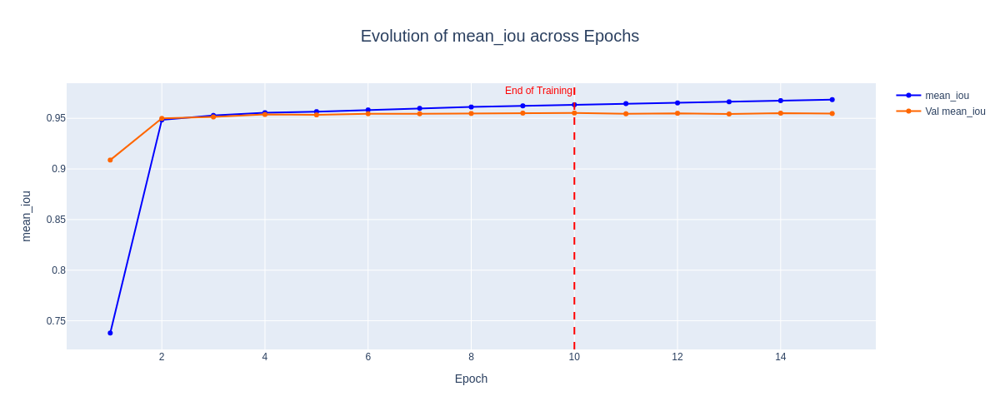

In [ ]:
# Static image for GitHub
plot_metrics(history, idxmax, metrics=list(history.keys())[:3], renderer="png")

### **Mean IoU and Dice Score**

In [ ]:
# Instantiate the segmentation metrics
mean_iou = SegmentationMetrics(
    metric_name="mean_iou",
    num_classes=num_classes
)

dice_score = SegmentationMetrics(
    metric_name="dice_score",
    num_classes=num_classes
)

# TensorFlow Mean IoU Metric
mean_iou_tf = tf.keras.metrics.MeanIoU(
    num_classes=num_classes,
    sparse_y_true=True,
    sparse_y_pred=True
)

In [ ]:
# Extract the components of the test dataset and make predictions
test_dataset = prepare_dataset(
    df_test,
    train=False,
    drop_remainder=False
)

images_test = test_dataset.unbatch().map(lambda x, y: x)
images_test = np.array(list(images_test.as_numpy_iterator()))

masks_test = test_dataset.unbatch().map(lambda x, y: y)
masks_test = np.array(list(masks_test.as_numpy_iterator()))

masks_test_pred = model.predict(test_dataset)
masks_test_pred = np.argmax(masks_test_pred, axis=-1)

182/182 [==============================] - 116s 416ms/step


In [ ]:
# Update the metrics
for i in tqdm(range(0, len(masks_test), batch_size)):
  batch_true = masks_test[i: i + batch_size]
  batch_pred = masks_test_pred[i: i + batch_size]

  dice_score.update_state(batch_true, batch_pred, preprocess=False)
  mean_iou.update_state(batch_true, batch_pred, preprocess=False)
  mean_iou_tf.update_state(batch_true, batch_pred)

  0%|          | 0/182 [00:00<?, ?it/s]

In [ ]:
# Create a DataFrame with the metrics for each class
df_test = pd.DataFrame({
    "Class": class_names,
    "IoU": mean_iou.result_by_class(),
    "Dice Score": dice_score.result_by_class()
})
df_test

,Class,IoU,Dice Score
0,background,0.987384,0.993652
1,bird,0.923209,0.960071


In [ ]:
df_test.IoU.mean(), mean_iou_tf.result().numpy(), df_test["Dice Score"].mean()

(0.95529664, 0.95529664, 0.9768618)

It can be seen that the results of the custom **Mean IoU** metric and the **TensorFlow** metric match, which helps verify and confirm that the custom metric is correctly implemented. However, the custom metric is superior as it not only calculates the **Mean IoU** but also the **Dice Score**. Additionally, it offers the option to calculate the **Mean IoU** both globally and per class, a feature that the **TensorFlow** metric does not provide.

## **Inference with the Trained Model**

### **Test Dataset**

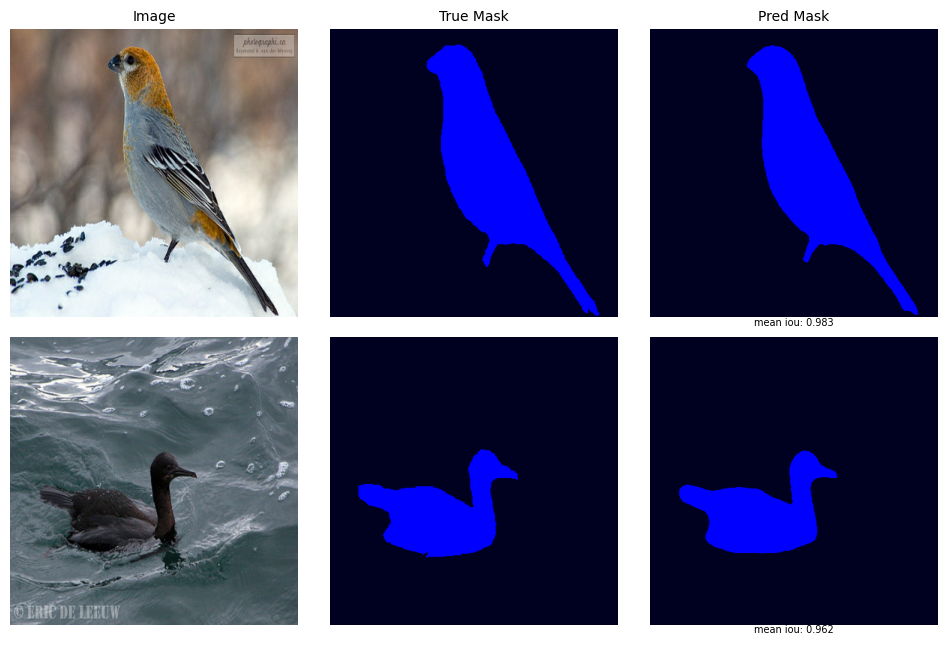

In [ ]:
plot_image_masks(images_test, masks_test, masks_test_pred, n_rows=2, metric=mean_iou)

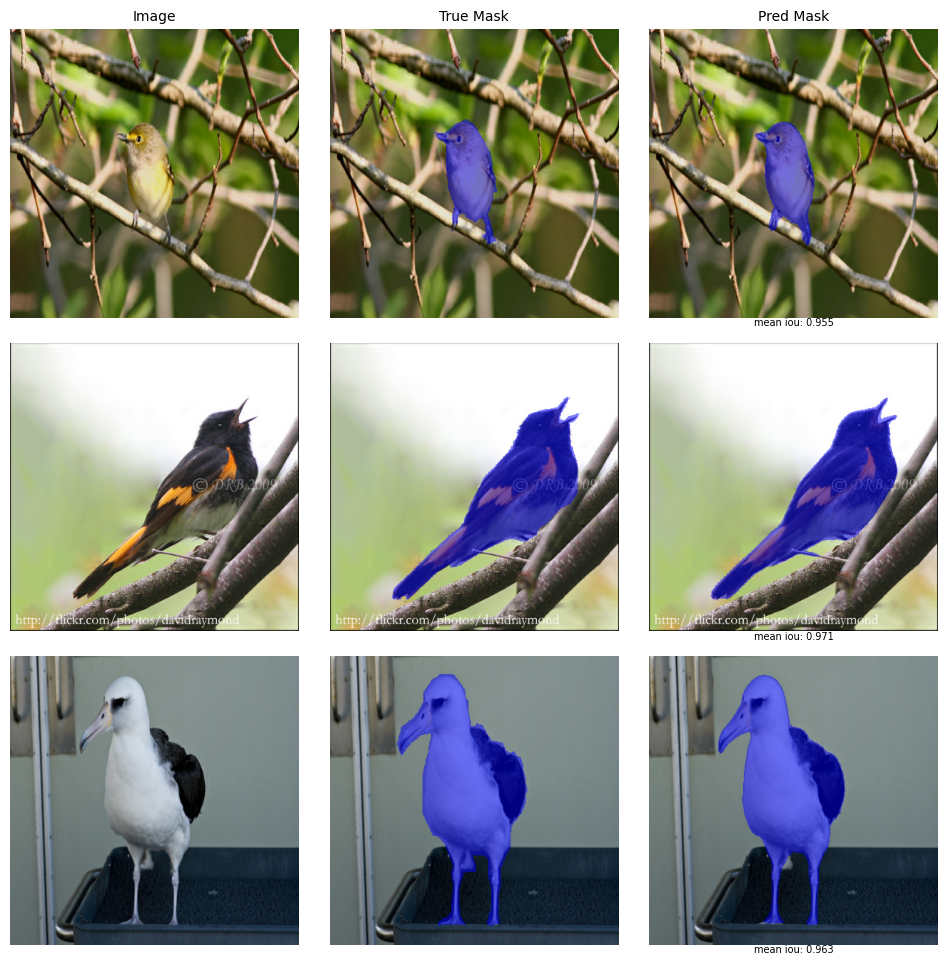

In [ ]:
plot_image_masks(images_test, masks_test, masks_test_pred, random=False, blended=True, metric=mean_iou)

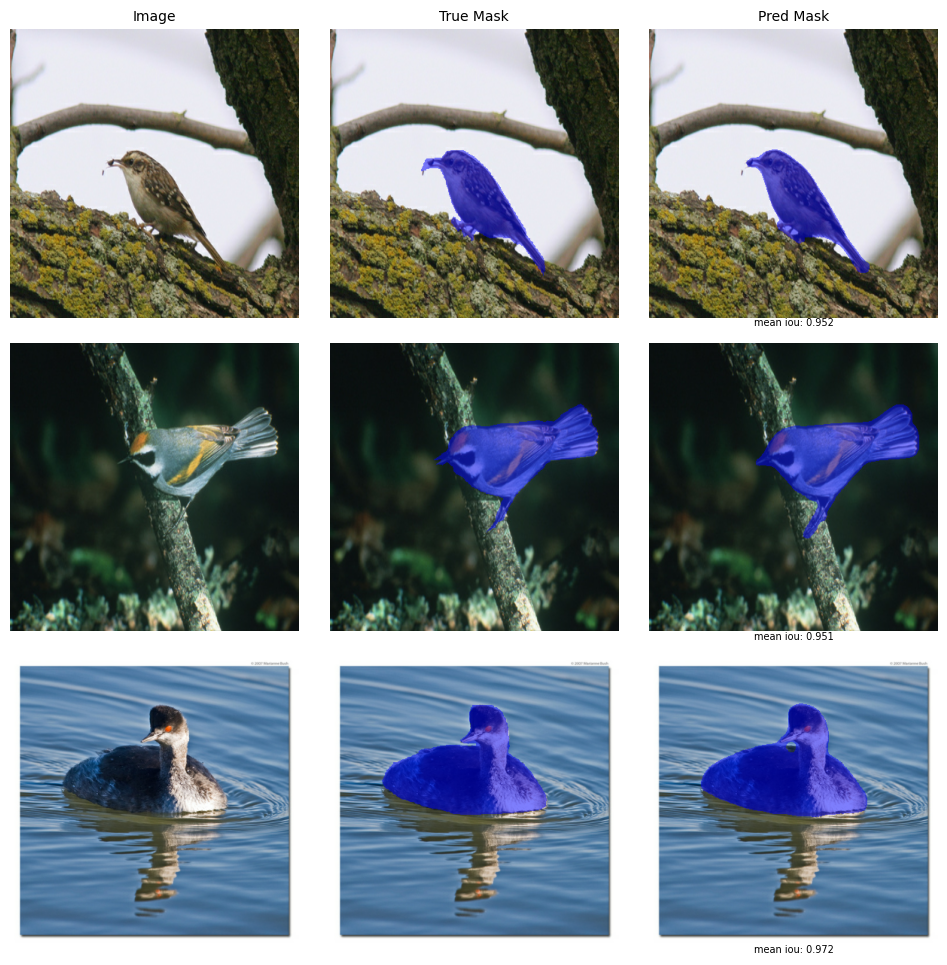

In [ ]:
plot_image_masks(images_test, masks_test, masks_test_pred, blended=True, metric=mean_iou)

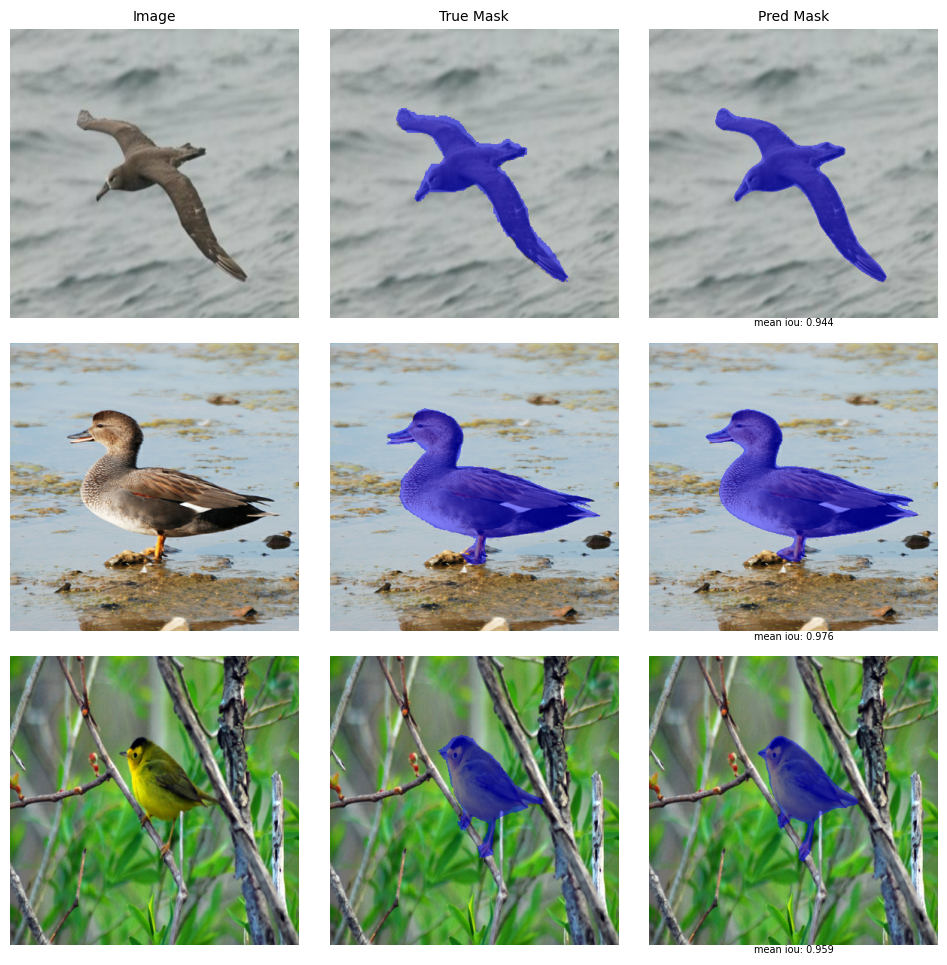

In [ ]:
plot_image_masks(
    images_test, masks_test, masks_test_pred,
    blended=True, metric=mean_iou, save=True,
    path_save="BinarySegmentation_ConvNeXtBase-U-Net_CUB-200-2011_1.png"
)

### **Internet Images (Instance Segmentation)**

Since models for [Fine-Grained Image Classification](https://github.com/JersonGB22/ImageClassification-TensorFlow/blob/main/VisionTransformerModels/Fine-Grained_ImageClassification_ConvNeXTV2_CUB-200-2011_eBird.ipynb) and [Object Localization](https://github.com/JersonGB22/ObjectDetection-TensorFlow-PyTorch/blob/main/BasicModels/ObjectLocalization_EfficientNetV2S_CUB-200-2011.ipynb) have already been implemented using the **CUB-200-2011** dataset, they can be combined with the now-implemented binary semantic segmentation model to create an **instance segmentation** system where each image contains only one bird.

In [5]:
# Install the latest version of the Transformers library that is compatible with Colab's TPU
!pip install transformers==4.44.2 -q

# Additional imports
from transformers import AutoImageProcessor, TFAutoModelForImageClassification
import matplotlib.patches as patches

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 61.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 66.0 MB/s eta 0:00:00


In [6]:
# Paths for the classification and localization models
cls_model_path = "/content/drive/MyDrive/models/Fine-Grained_ImageClassification_ConvNeXTV2_CUB-200-2011_eBird"
loc_model_path = "/content/drive/MyDrive/models/ObjectLocalization_EfficientNetV2-S_CUB-200-2011"

In [10]:
# Download the image processor for the classification model
image_processor = AutoImageProcessor.from_pretrained("facebook/convnextv2-large-22k-384")

# Get the bird names
class_names_cls = df_data.sort_values(by="label").name.apply(lambda x: x.lower()).unique()

In [11]:
tf.keras.backend.clear_session()

# Load the classification model
model_cls = TFAutoModelForImageClassification.from_pretrained(cls_model_path)

# Load the localization model
model_loc = tf.keras.models.load_model(loc_model_path, compile=False)

# Load the segmentation model weights
model_seg = build_convnext_unet(image_size, num_classes)
model_seg.load_weights(trained_model_path)

All model checkpoint layers were used when initializing TFConvNextV2ForImageClassification.

All the layers of TFConvNextV2ForImageClassification were initialized from the model checkpoint at /content/drive/MyDrive/models/Fine-Grained_ImageClassification_ConvNeXTV2_CUB-200-2011_eBird.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFConvNextV2ForImageClassification for predictions without further training.


350926856/350926856 [==============================] - 2s 0us/step


In [12]:
# Function for instance segmentation with images from the internet
def cub_200_2011_segmentation(list_urls, n_rows=3, n_cols=3, alpha=0.6, save=False, path_save=""):

  # Download the images and convert them to NumPy arrays
  images = []
  for url in list_urls[:int(n_rows * n_cols)]:
    path = tf.keras.utils.get_file(origin=url)
    image = tf.keras.utils.load_img(path)
    images.append(np.array(image))

  # Convert the images to tensors and resize them
  inputs = tf.stack([tf.image.resize(image, image_size[:-1]) for image in images])

  # Predict the classes and logits of the images
  pred_labels = model_cls(**image_processor(images, return_tensors="tf")).logits
  pred_labels = tf.nn.softmax(pred_labels, axis=-1)
  logits = tf.reduce_max(pred_labels, axis=-1)
  pred_labels = tf.argmax(pred_labels, axis=-1)
  pred_labels = class_names_cls[pred_labels]

  # Predict the coordinates of the bounding boxes
  pred_boxes = model_loc.predict(inputs / 255, verbose=0)

  # Predict the segmentation masks
  pred_masks = model_seg.predict(inputs, verbose=0)
  pred_masks = tf.argmax(pred_masks, axis=-1)

  fig, axes = plt.subplots(n_rows, n_cols, figsize=(3.5 * n_cols, 3.5 * n_rows))

  for i, ax in enumerate(axes.flat):
    image = images[i]
    label = pred_labels[i]
    logit = logits[i]
    shape = image.shape

    box = pred_boxes[i]
    ymin, xmin, ymax, xmax = tuple(box)
    ymin, ymax = ymin * shape[0], ymax * shape[0]
    xmin, xmax = xmin * shape[1], xmax * shape[1]
    rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1.5, edgecolor="blue", facecolor="none")

    mask = pred_masks[i][..., None]
    mask = tf.image.resize(mask, shape[:-1], method="nearest")
    mask_cls = mask.numpy().squeeze()
    mask_rgb = class_colors[mask_cls].astype(image.dtype)
    mask_rgb[mask_cls == background_class] = image[mask_cls == background_class]
    blended_image = cv2.addWeighted(image / 255, 1 - alpha, mask_rgb / 255, alpha, 0)

    ax.imshow(blended_image)
    ax.add_patch(rect)
    ax.text(
        x=xmin, y=ymin, s=f"{label}  {logit:.2f}",
        color="black", fontsize=9, fontweight="bold", ha="left", va="bottom",
        bbox={"boxstyle": "square,pad=0", "facecolor": "blue", "edgecolor":"blue", "alpha": 0.7}
    )
    ax.axis("off")

  plt.tight_layout()
  # Save images
  if save:
    plt.savefig(path_save)

  plt.show()

In [13]:
list_urls = [
    "https://www.sdakotabirds.com/species_photos/flycatchers/least_flycatcher_8.jpg",
    "https://www.eopugetsound.org/sites/default/files/topical_article/images/28777858956_350d7b5be5_b_0.jpg",
    "https://media.audubon.org/nas_birdapi_hero/eastern-whip-poor-will_005_shutterstock_1219487134.jpg",
    "https://smallsensorphotography.com/wordpress/wp-content/uploads/2023/05/4090193_DxO3909wprocapH1200.jpg",

    "https://live.staticflickr.com/65535/47057120154_e3fa046c41_b.jpg",
    "https://media01.stockfood.com/largepreviews/MjIwMjU5MTU0MA==/71051340-Cape-Starling-Cape-Glossy-Starling-Lamprotornis-nitens-a-species-of-starling-in-the-Sturnidae-family-South.jpg",
    "https://s7d1.scene7.com/is/image/isp/wabpileatedwoodpecker-bs?qlt=100&wid=1200&ts=1706031334554&$ImageComponent$&fit=constrain",
    "https://climate2014.audubon.org/sites/default/files/styles/focal_bird_engagement/public/bird_images/Bohemian_Waxwing_DanielArndt_FlickrCCWEB.jpg?itok=Xqe_LlNK",
    "https://images.naturephotographers.network/optimized/3X/7/3/732567f473e07f5d310536879f258a1c55f3ec76_2_1024x682.jpeg",
    "https://www.eekwi.org/sites/default/files/whitepelicanflight.jpg",
    "https://i.pinimg.com/736x/83/a6/75/83a6755b34404cc4b833c13dee4e28e0.jpg",
    "https://live.staticflickr.com/8311/28912864553_bc32e3f5e9_c.jpg",
    "https://i.pinimg.com/564x/f9/5d/d2/f95dd2a1ea8ce6fe90c61472576eb451.jpg",

    "https://tgreybirds.com/PelagicCormorant09.jpg",
    "https://cdn.download.ams.birds.cornell.edu/api/v1/asset/303379871/320",
    "https://lostcoastoutpost.com/loco-media/loco-media/taxa/observationphoto/442/original.webp",
    "https://www.mediastorehouse.com.au/p/467/great-tailed-grackle-quiscalus-mexicanus-13977938.jpg.webp",
    "https://objects.liquidweb.services/images/201407/frode_jacobsen_7467757054_98545d8fdf_z.jpg",
    "https://live.staticflickr.com/8059/8201732475_b274c4c147_c.jpg",
    "https://www.sdakotabirds.com/species_photos/warblers/american_redstart_16.jpg",
    "https://cdn.firespring.com/images/3aca91b5-d451-47c6-8283-6e918937c6ee.jpg",
    "https://images.squarespace-cdn.com/content/v1/543e7367e4b0f38ea790072b/1454429704411-DTDBTPDXXEH107770RMM/image-asset.jpeg",
]

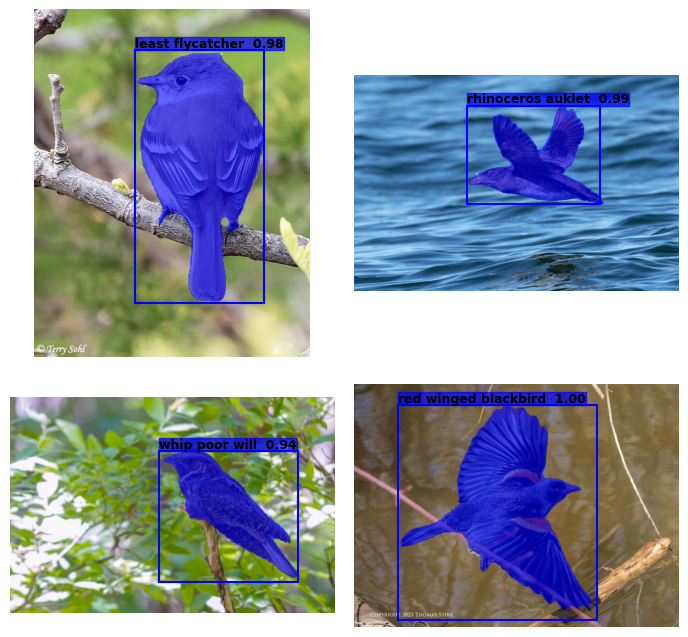

In [15]:
cub_200_2011_segmentation(list_urls, n_rows=2, n_cols=2)

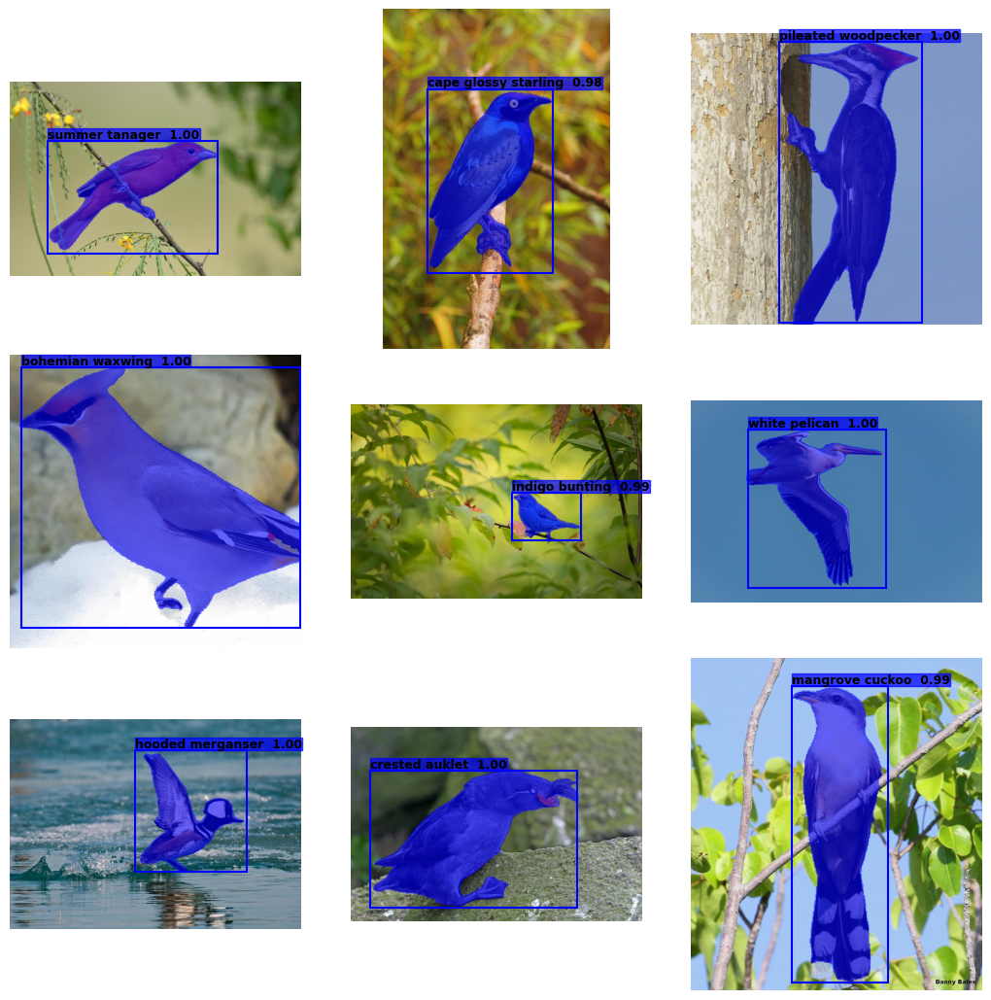

In [20]:
cub_200_2011_segmentation(
    list_urls[4:], save=True,
    path_save="BinarySegmentation_ConvNeXtBase-U-Net_CUB-200-2011_2.png"
)

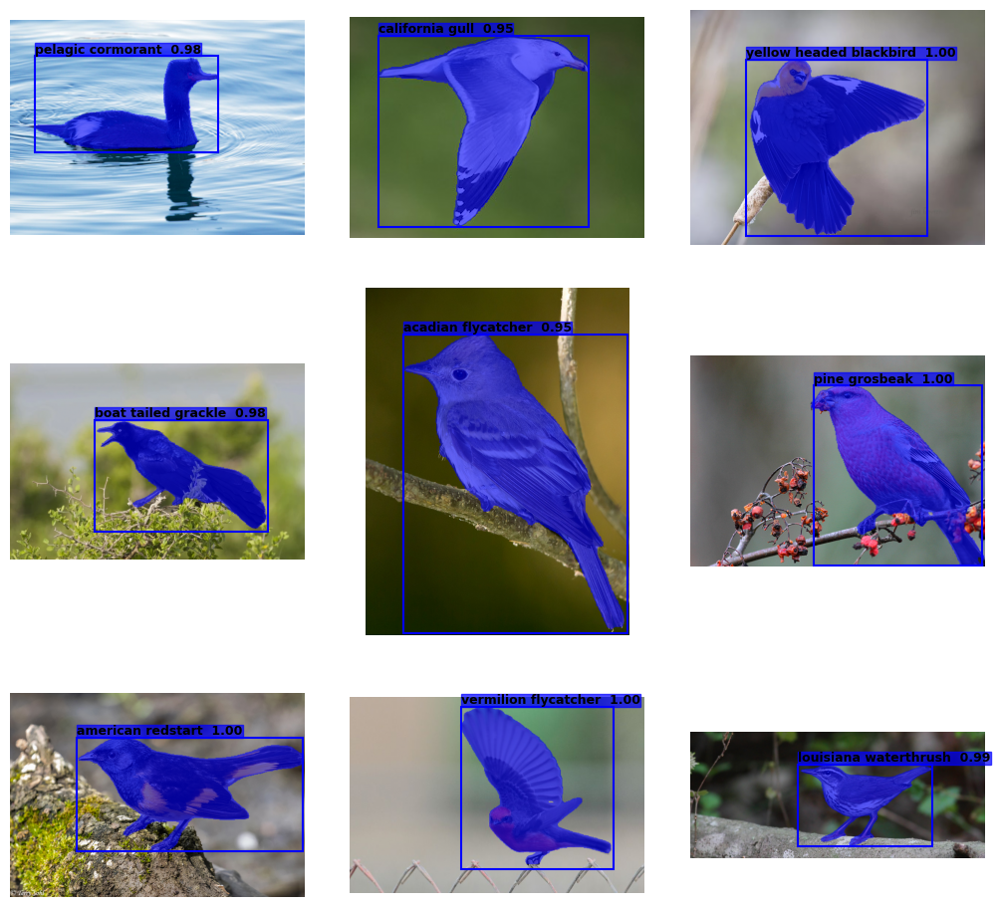

In [19]:
cub_200_2011_segmentation(list_urls[13:])

## **Conclusion**

The **ConvNeXtBase U-Net** model achieved a **Mean IoU** of **0.9650** on the **training dataset** and a **Mean IoU** of **0.9553**, along with a **Dice Score** of **0.9769**, on the **test dataset**. These results highlight excellent performance, as the model accurately segments images of birds from different species in various environments and with different backgrounds. Additionally, there is only slight overfitting, which demonstrates that techniques such as data augmentation and the use of a learning rate scheduler were highly effective.

It is also worth noting that the use of **generalized dice loss** was crucial in reducing the class imbalance, as reflected in the segmentation metrics for the **background** and **bird** classes in the test dataset, where the difference is small. In comparison, using a loss function based on **weighted cross-entropy** would likely result in a larger difference between the classes.

To achieve even better results, it would be necessary to refine the segmentation masks in the **CUB-200-2011** dataset, especially in detailed areas like the legs and beaks, which are sometimes not fully accurate, as seen in the inference section. These inaccuracies may affect the model’s performance. Additionally, increasing the number of images and segmentation masks in the training dataset and exploring more advanced models, such as **ConvNeXt Large** or **SegFormer**, could further improve results. Despite these potential improvements, the model already stands as a robust and efficient solution for binary segmentation tasks involving birds in different environments, demonstrating remarkable ability to capture complex details with high precision.